# RNA Velocity Basics

In [1]:
# update to the latest version, if not done yet.
# !pip install scvelo --upgrade --quiet

In [1]:
import scvelo as scv
import loompy

import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
from scipy import sparse
import os
import matplotlib as mpl
from anndata.experimental.multi_files import AnnCollection
from matplotlib.pyplot import rc_context

import celltypist
from celltypist import models

In [2]:
scv.settings.verbosity = 3
scv.logging.print_version()
scv.settings.presenter_view = True  # set max width size for presenter view
scv.settings.set_figure_params('scvelo', dpi=120, frameon=False, figsize=(3, 3), facecolor='white')

Running scvelo 0.2.4 (python 3.9.7) on 2023-10-30 10:15.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI no longer supports 'pip search' (or XML-RPC search). Please use https://pypi.org/search (via a browser) instead. See https://warehouse.pypa.io/api-reference/xml-rpc.html#deprecated-methods for more information.


In [3]:
pd.set_option('display.max_rows', 10)
pd.set_option('display.max_columns', None)

In [4]:
wdir = "/Users/xuewei/ZxProjects/CRC/2023_GSE231559/01_preprocessing/30_Myeloid_clustering/"
os.chdir( wdir )

## Load the Data

In [80]:
adata = sc.read('/Users/xuewei/ZxProjects/CRC/2023_GSE231559/01_preprocessing/write/CRC_04_Cell_Atlas.h5ad', cache=False)

In [74]:
adata

AnnData object with n_obs × n_vars = 56163 × 13401
    obs: 'batch', 'n_genes_by_counts', 'total_counts', 'n_genes', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts_all', 'umap_density_batch', 'louvain', 'sample', 'louvain_anno'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mt', 'ribo', 'hb', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_counts', 'mean', 'std'
    uns: 'batch_colors', 'draw_graph', 'hvg', 'log1p', 'louvain', 'louvain_anno_colors', 'louvain_colors', 'neighbors', 'pca', 'sample_colors', 'umap', 'umap_density_batch_params'
    obsm: 'X_draw_graph_fa', 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'dis

In [75]:
adata.obs

,batch,n_genes_by_counts,total_counts,n_genes,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,n_counts_all,umap_density_batch,louvain,sample,louvain_anno
AAAGGGCTCTGCAGCG-1,Col_N_1,1464,6027.0,1464,7.289611,8.704170,29.766053,477.0,6.169611,7.914385,2692.0,7.898411,44.665672,0.0,0.000000,0.000000,1337.232178,0.378650,6,Col_N,T cells
AAAGTGAGTCCATACA-1,Col_N_1,965,2267.0,966,6.873164,7.726654,20.776356,226.0,5.424950,9.969122,420.0,6.042633,18.526688,2.0,1.098612,0.088222,1431.658691,0.028019,9,Col_N,Endothelial cells
AAAGTGATCGACCACG-1,Col_N_1,727,1730.0,727,6.590301,7.456455,31.734104,140.0,4.948760,8.092485,42.0,3.761200,2.427746,1.0,0.693147,0.057803,1357.053833,0.898012,17,Col_N,Epithelial cells
AAAGTGATCTGCATGA-1,Col_N_1,610,1206.0,610,6.415097,7.095893,21.890547,67.0,4.219508,5.555556,386.0,5.958425,32.006634,0.0,0.000000,0.000000,1002.002014,0.292703,6,Col_N,T cells
AACAACCTCAGCTTCC-1,Col_N_1,1718,4330.0,1718,7.449498,8.373553,23.602771,321.0,5.774551,7.413395,756.0,6.629363,17.459585,0.0,0.000000,0.000000,1959.104736,0.160171,4,Col_N,NK cells
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTGTTTGACAC-1,Liv_T_12,1497,4999.0,1497,7.311886,8.517193,25.585117,44.0,3.806663,0.880176,1347.0,7.206378,26.945389,0.0,0.000000,0.000000,1640.089722,0.567210,2,Liv_T,T cells
TTTGGTTTCATAGCAC-1,Liv_T_12,1289,3741.0,1289,7.162397,8.227375,24.405239,88.0,4.488636,2.352312,933.0,6.839477,24.939856,0.0,0.000000,0.000000,1533.361328,0.967280,2,Liv_T,T cells
TTTGGTTTCCTCTAGC-1,Liv_T_12,1058,2873.0,1058,6.965080,7.963460,22.868082,159.0,5.075174,5.534285,761.0,6.635947,26.487991,0.0,0.000000,0.000000,1393.979980,0.791807,2,Liv_T,T cells
TTTGTTGAGAGGTTTA-1,Liv_T_12,953,2525.0,953,6.860664,7.834392,27.643564,121.0,4.804021,4.792079,683.0,6.527958,27.049505,0.0,0.000000,0.000000,1274.745239,0.720940,2,Liv_T,T cells


In [77]:
adata.obs['louvain_anno'].value_counts()

T cells              36566
Myeloid cells         6549
NK cells              5283
Epithelial cells      2743
B cells               2046
Endothelial cells     1703
Plasma cells           980
Fibroblast cells       215
Mast cells              78
Name: louvain_anno, dtype: int64

## Select NK cells

In [81]:
adata = adata[adata.obs['louvain_anno'].isin(['Myeloid cells', 'Mast cells'])]
adata

View of AnnData object with n_obs × n_vars = 6627 × 13401
    obs: 'batch', 'n_genes_by_counts', 'total_counts', 'n_genes', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts_all', 'umap_density_batch', 'louvain', 'sample', 'louvain_anno'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mt', 'ribo', 'hb', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_counts', 'mean', 'std'
    uns: 'batch_colors', 'draw_graph', 'hvg', 'log1p', 'louvain', 'louvain_anno_colors', 'louvain_colors', 'neighbors', 'pca', 'sample_colors', 'umap', 'umap_density_batch_params'
    obsm: 'X_draw_graph_fa', 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities

In [55]:
adata.shape

(56163, 13401)

In [58]:
adata.obs.head(5)

,batch,n_genes_by_counts,total_counts,n_genes,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,n_counts_all,umap_density_batch,louvain,sample,louvain_anno
ATCGTAGTCCGTGACG-1,Col_N_1,442,916.0,442,6.093570,6.821107,40.393013,89.0,4.499810,9.716157,13.0,2.639057,1.419214,0.0,0.000000,0.000000,927.649597,0.110158,3,Col_N,Myeloid cells
CAAGGGACAGAGGCTA-1,Col_N_1,326,712.0,326,5.789960,6.569481,45.786517,61.0,4.127134,8.567416,11.0,2.484907,1.544944,0.0,0.000000,0.000000,731.465454,0.113902,3,Col_N,Myeloid cells
CAGCAATAGGACAGCT-1,Col_N_1,782,1448.0,782,6.663133,7.278629,20.165746,133.0,4.897840,9.185083,226.0,5.424950,15.607736,0.0,0.000000,0.000000,1339.269043,0.065946,3,Col_N,Myeloid cells
CAGGGCTCATGTACGT-1,Col_N_1,2466,9730.0,2466,7.810758,9.183072,20.400822,845.0,6.740520,8.684481,1943.0,7.572503,19.969168,7.0,2.079442,0.071942,2090.915039,0.046685,8,Col_N,Myeloid cells
CATTGAGCAAAGGGCT-1,Col_N_1,2708,11213.0,2708,7.904335,9.324919,21.840721,1009.0,6.917706,8.998485,1874.0,7.536364,16.712744,0.0,0.000000,0.000000,2167.414307,0.073181,8,Col_N,Myeloid cells


In [82]:
sc.tl.pca(adata, svd_solver='arpack', n_comps=40)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.tsne(adata)
sc.tl.umap(adata)

In [83]:
adata.obs.head(5)

,batch,n_genes_by_counts,total_counts,n_genes,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,n_counts_all,umap_density_batch,louvain,sample,louvain_anno
ATCGTAGTCCGTGACG-1,Col_N_1,442,916.0,442,6.093570,6.821107,40.393013,89.0,4.499810,9.716157,13.0,2.639057,1.419214,0.0,0.000000,0.000000,927.649597,0.110158,3,Col_N,Myeloid cells
CAAGGGACAGAGGCTA-1,Col_N_1,326,712.0,326,5.789960,6.569481,45.786517,61.0,4.127134,8.567416,11.0,2.484907,1.544944,0.0,0.000000,0.000000,731.465454,0.113902,3,Col_N,Myeloid cells
CAGCAATAGGACAGCT-1,Col_N_1,782,1448.0,782,6.663133,7.278629,20.165746,133.0,4.897840,9.185083,226.0,5.424950,15.607736,0.0,0.000000,0.000000,1339.269043,0.065946,3,Col_N,Myeloid cells
CAGGGCTCATGTACGT-1,Col_N_1,2466,9730.0,2466,7.810758,9.183072,20.400822,845.0,6.740520,8.684481,1943.0,7.572503,19.969168,7.0,2.079442,0.071942,2090.915039,0.046685,8,Col_N,Myeloid cells
CATTGAGCAAAGGGCT-1,Col_N_1,2708,11213.0,2708,7.904335,9.324919,21.840721,1009.0,6.917706,8.998485,1874.0,7.536364,16.712744,0.0,0.000000,0.000000,2167.414307,0.073181,8,Col_N,Myeloid cells


In [84]:
sc.tl.louvain(adata, resolution = 0.25, key_added = "louvain_2nd")

In [85]:
adata.obs['louvain_2nd'].value_counts()

0    2175
1    1292
2    1104
3     831
4     678
5     260
6     209
7      61
8      17
Name: louvain_2nd, dtype: int64

In [86]:
adata.obs['batch'].value_counts()

Liv_T_9     1358
Liv_N_9     1286
Liv_N_3      549
Liv_T_11     373
Liv_N_4      358
            ... 
Col_T_1       38
Col_N_3       32
Liv_N_11      28
Col_N_1       18
Liv_N_7       16
Name: batch, Length: 24, dtype: int64

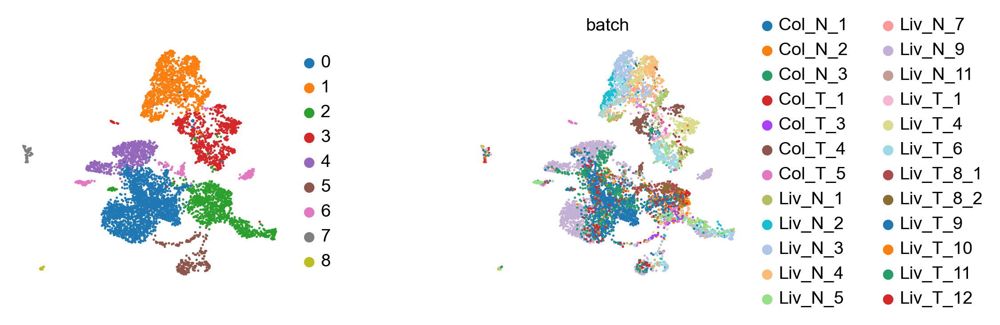

In [87]:
with rc_context({'figure.figsize': (3, 3), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.umap(adata, color=['louvain_2nd', 'batch'], title='', size=10, wspace=0.5, legend_fontsize=12, frameon=False, legend_loc='right margin', show=True)

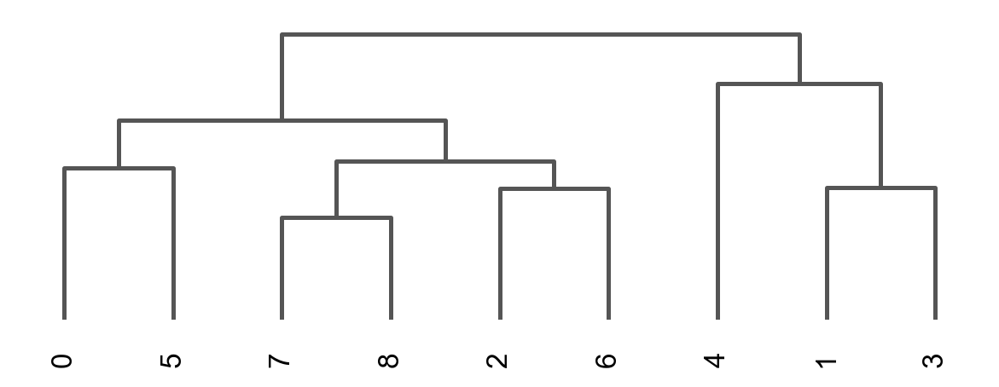

In [88]:
with rc_context({'figure.figsize': (6, 2), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.tl.dendrogram(adata, groupby = 'louvain_2nd', cor_method='pearson')
    ax = sc.pl.dendrogram(adata, groupby = 'louvain_2nd', show=True, save="_01_louvain_2nd_cluster.pdf")
    # ax = sc.pl.correlation_matrix(adata, 'louvain_2nd', figsize=(10, 9), show=True, save="_01_correlation.pdf")

## Assign cell type labels using a CellTypist built-in model

In [89]:
import celltypist
from celltypist import models

models.models_path
models.models_description()

👉 Detailed model information can be found at `https://www.celltypist.org/models`


,model,description
0,Immune_All_Low.pkl,immune sub-populations combined from 20 tissue...
1,Immune_All_High.pkl,immune populations combined from 20 tissues of...
2,Adult_Mouse_Gut.pkl,cell types in the adult mouse gut combined fro...
3,Autopsy_COVID19_Lung.pkl,cell types from the lungs of 16 SARS-CoV-2 inf...
4,COVID19_Immune_Landscape.pkl,immune subtypes from lung and blood of COVID-1...
...,...,...
13,Human_Lung_Atlas.pkl,integrated Human Lung Cell Atlas (HLCA) combin...
14,Human_PF_Lung.pkl,cell types from different forms of pulmonary f...
15,Lethal_COVID19_Lung.pkl,cell types from the lungs of individuals who d...
16,Nuclei_Lung_Airway.pkl,cell populations from snRNA-seq of five locati...


In [90]:
# Indeed, the `model` argument defaults to `Immune_All_Low.pkl`.
model = models.Model.load(model = 'Immune_All_High.pkl')
model.description
model.cell_types

array(['B cells', 'B-cell lineage', 'Cycling cells', 'DC', 'DC precursor',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ETP',
       'Early MK', 'Endothelial cells', 'Epithelial cells',
       'Erythrocytes', 'Erythroid', 'Fibroblasts', 'Granulocytes',
       'HSC/MPP', 'ILC', 'ILC precursor', 'MNP', 'Macrophages',
       'Mast cells', 'Megakaryocyte precursor',
       'Megakaryocytes/platelets', 'Mono-mac', 'Monocyte precursor',
       'Monocytes', 'Myelocytes', 'Plasma cells', 'Promyelocytes',
       'T cells', 'pDC', 'pDC precursor'], dtype=object)

In [91]:
predictions = celltypist.annotate(adata, model = 'Immune_All_High.pkl', majority_voting = True)

👀 Detected scaled expression in the input data, will try the `.raw` attribute
🔬 Input data has 6627 cells and 30726 genes
🔗 Matching reference genes in the model
🧬 6124 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [92]:
predictions.predicted_labels

,predicted_labels,over_clustering,majority_voting
ATCGTAGTCCGTGACG-1,Monocytes,78,Monocytes
CAAGGGACAGAGGCTA-1,Monocytes,78,Monocytes
CAGCAATAGGACAGCT-1,Macrophages,96,Macrophages
CAGGGCTCATGTACGT-1,Monocytes,62,Monocytes
CATTGAGCAAAGGGCT-1,Macrophages,96,Macrophages
...,...,...,...
TTACGTTAGGCTCACC-1,DC,27,DC
TTCTTCCCACCTCTGT-1,DC,9,DC
TTGAACGGTACTTCCC-1,Macrophages,5,Macrophages
TTGTTCATCCGCGGAT-1,Macrophages,5,Macrophages


In [93]:
# Get an `AnnData` with predicted labels embedded into the cell metadata columns.
adata_predic = predictions.to_adata()

In [94]:
adata_predic.obs

,batch,n_genes_by_counts,total_counts,n_genes,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,n_counts_all,umap_density_batch,louvain,sample,louvain_anno,louvain_2nd,predicted_labels,over_clustering,majority_voting,conf_score
ATCGTAGTCCGTGACG-1,Col_N_1,442,916.0,442,6.093570,6.821107,40.393013,89.0,4.499810,9.716157,13.0,2.639057,1.419214,0.0,0.000000,0.000000,927.649597,0.110158,3,Col_N,Myeloid cells,6,Monocytes,78,Monocytes,0.929089
CAAGGGACAGAGGCTA-1,Col_N_1,326,712.0,326,5.789960,6.569481,45.786517,61.0,4.127134,8.567416,11.0,2.484907,1.544944,0.0,0.000000,0.000000,731.465454,0.113902,3,Col_N,Myeloid cells,6,Monocytes,78,Monocytes,0.992200
CAGCAATAGGACAGCT-1,Col_N_1,782,1448.0,782,6.663133,7.278629,20.165746,133.0,4.897840,9.185083,226.0,5.424950,15.607736,0.0,0.000000,0.000000,1339.269043,0.065946,3,Col_N,Myeloid cells,2,Macrophages,96,Macrophages,0.363076
CAGGGCTCATGTACGT-1,Col_N_1,2466,9730.0,2466,7.810758,9.183072,20.400822,845.0,6.740520,8.684481,1943.0,7.572503,19.969168,7.0,2.079442,0.071942,2090.915039,0.046685,8,Col_N,Myeloid cells,1,Monocytes,62,Monocytes,0.994861
CATTGAGCAAAGGGCT-1,Col_N_1,2708,11213.0,2708,7.904335,9.324919,21.840721,1009.0,6.917706,8.998485,1874.0,7.536364,16.712744,0.0,0.000000,0.000000,2167.414307,0.073181,8,Col_N,Myeloid cells,3,Macrophages,96,Macrophages,0.114627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTACGTTAGGCTCACC-1,Liv_T_12,2836,14258.0,2836,7.950502,9.565144,20.823397,404.0,6.003887,2.833497,2651.0,7.883070,18.593069,1.0,0.693147,0.007014,2133.536133,0.020422,3,Liv_T,Myeloid cells,0,DC,27,DC,0.187687
TTCTTCCCACCTCTGT-1,Liv_T_12,2262,11611.0,2262,7.724447,9.359795,30.695031,779.0,6.659294,6.709156,1691.0,7.433667,14.563775,0.0,0.000000,0.000000,1868.611816,0.019112,3,Liv_T,Myeloid cells,5,DC,9,DC,0.993027
TTGAACGGTACTTCCC-1,Liv_T_12,911,2450.0,911,6.815640,7.804251,26.040816,224.0,5.416101,9.142857,385.0,5.955837,15.714286,1.0,0.693147,0.040816,1294.677856,0.019674,3,Liv_T,Myeloid cells,2,Macrophages,5,Macrophages,0.999743
TTGTTCATCCGCGGAT-1,Liv_T_12,337,1121.0,337,5.823046,7.022868,50.401427,108.0,4.691348,9.634254,142.0,4.962845,12.667261,0.0,0.000000,0.000000,556.812134,0.025232,3,Liv_T,Myeloid cells,2,Macrophages,5,Macrophages,0.997746


In [95]:
# If the UMAP or any cell embeddings are already available in the `AnnData`, skip this command.
sc.tl.umap(adata_predic)

In [96]:
adata_predic

AnnData object with n_obs × n_vars = 6627 × 13401
    obs: 'batch', 'n_genes_by_counts', 'total_counts', 'n_genes', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts_all', 'umap_density_batch', 'louvain', 'sample', 'louvain_anno', 'louvain_2nd', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mt', 'ribo', 'hb', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_counts', 'mean', 'std'
    uns: 'batch_colors', 'draw_graph', 'hvg', 'log1p', 'louvain', 'louvain_anno_colors', 'louvain_colors', 'neighbors', 'pca', 'sample_colors', 'umap', 'umap_density_batch_params', 'tsne', 'louvain_2nd_colo

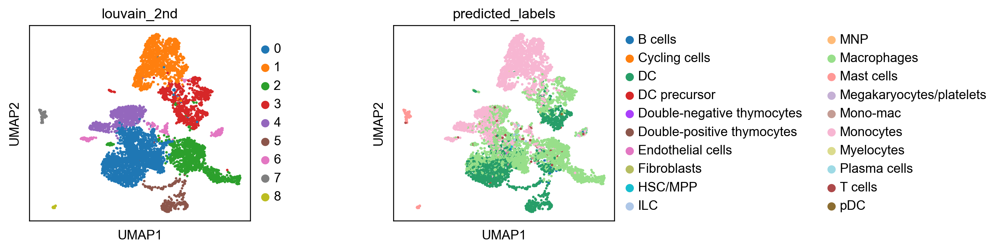

In [97]:
sc.pl.umap(adata_predic, color = ['louvain_2nd', 'predicted_labels'], wspace=0.5, show=True)

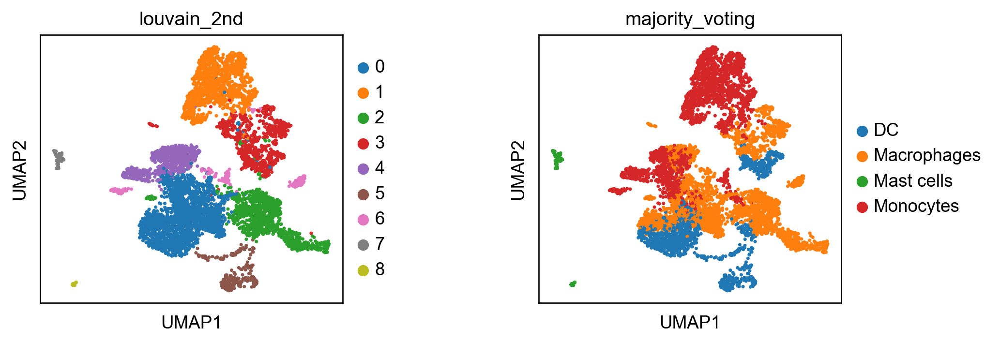

In [98]:
sc.pl.umap(adata_predic, color = ['louvain_2nd', 'majority_voting'], wspace=0.5, show=True)

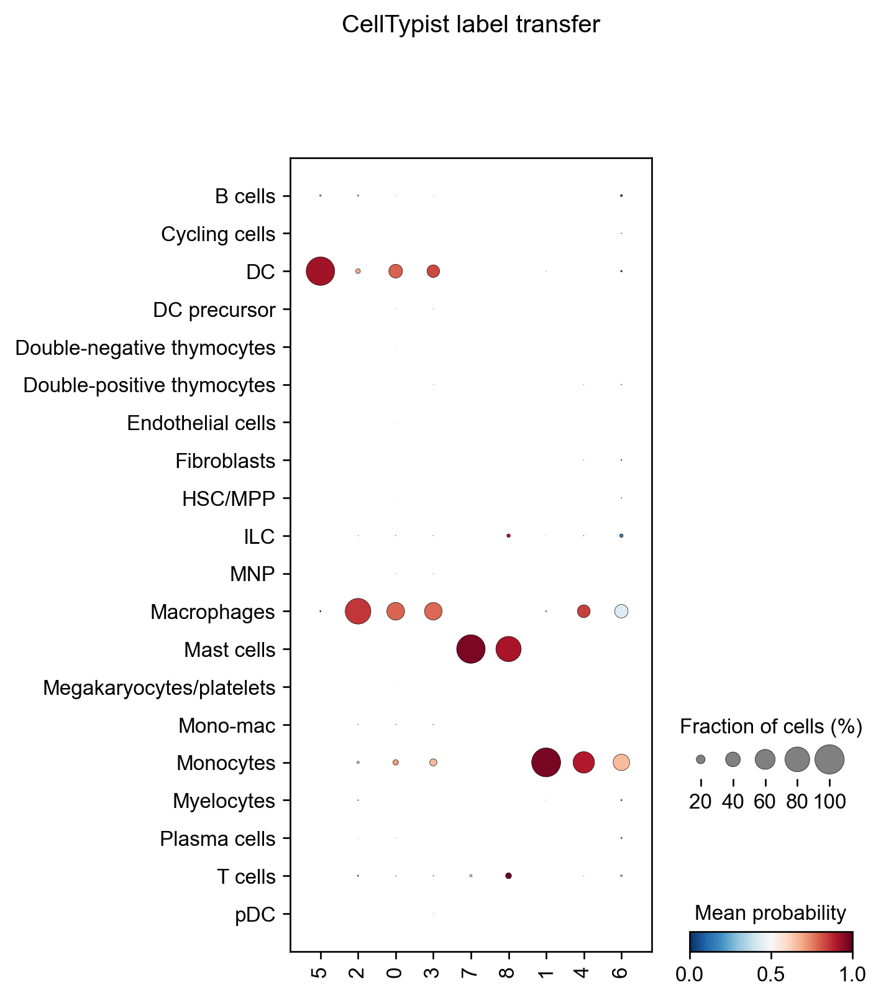

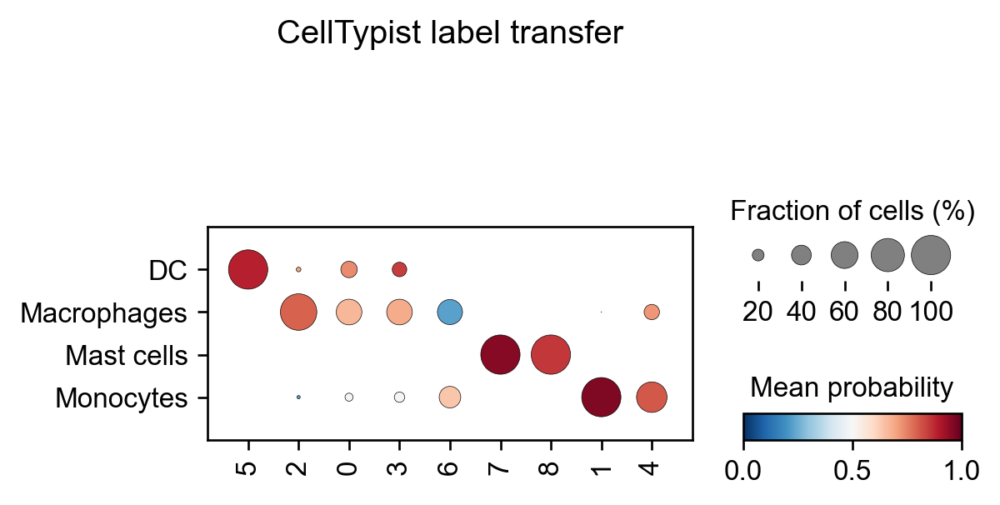

In [99]:
with rc_context({'figure.figsize': (6, 2), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    celltypist.dotplot(predictions, use_as_reference = 'louvain_2nd', use_as_prediction = 'predicted_labels', swap_axes=False, 
    standard_scale='var', mean_only_expressed=True, save="01_Immune_All_Low_louvain_2nd_predicted_labels.pdf")
    celltypist.dotplot(predictions, use_as_reference = 'louvain_2nd', use_as_prediction = 'majority_voting', swap_axes=False, 
    standard_scale='var', mean_only_expressed=True, save="02_Immune_All_Low_louvain_2nd_majorVot.pdf")

In [100]:
pd.set_option('display.max_rows', 12)
pd.set_option('display.max_columns', None)
adata.obs['majority_voting'].value_counts()

Macrophages    3015
Monocytes      2310
DC             1224
Mast cells       78
Name: majority_voting, dtype: int64

In [32]:
# # top_3_genes of Macrophages cells
# top_20_genes = model.extract_top_markers("ILC", 20)
# top_20_genes

# # # Check expression of the three genes in the query set.
# # # Here we use `majority_voting` from CellTypist as the cell type labels for this dataset.
# # sc.pl.violin(adata_predic, top_6_genes, groupby = 'majority_voting', wspace=0.5, rotation = 90)

## DEGs in Myeloid cells

In [101]:
sc.pp.log1p(adata)

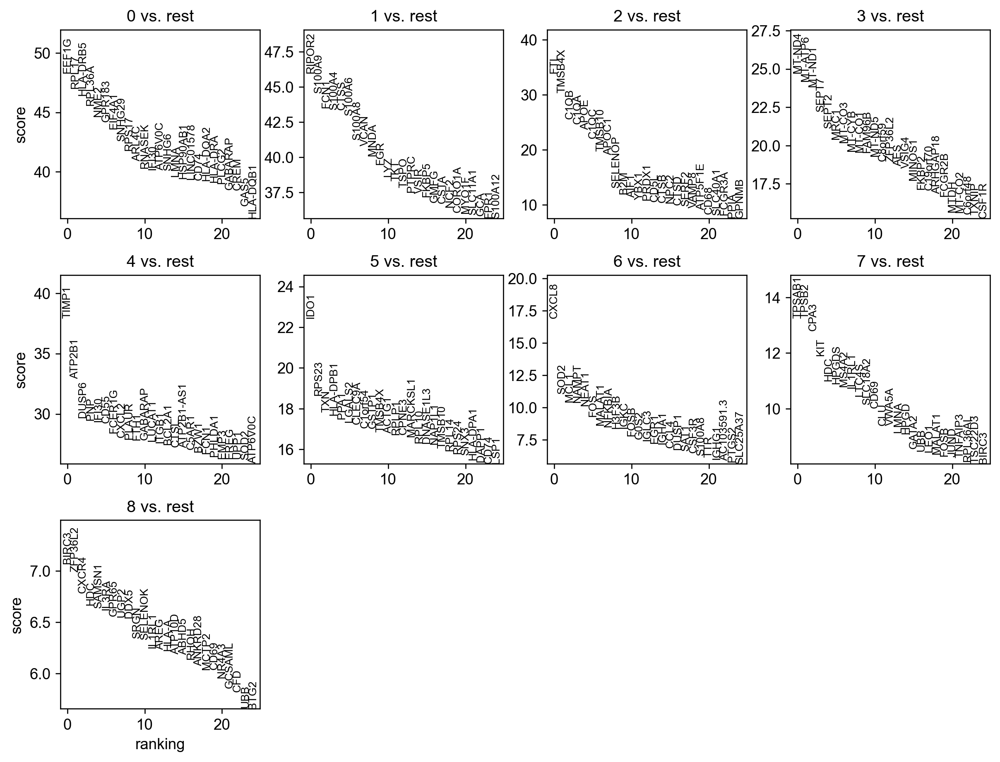

In [102]:
sc.tl.rank_genes_groups(adata, 'louvain_2nd', method='wilcoxon', pts=True)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, show=True)

In [103]:
res = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(500)
res.to_csv("/Users/xuewei/ZxProjects/CRC/2023_GSE231559/01_preprocessing/30_Myeloid_clustering/30_Myeloid_diff_top500.csv")

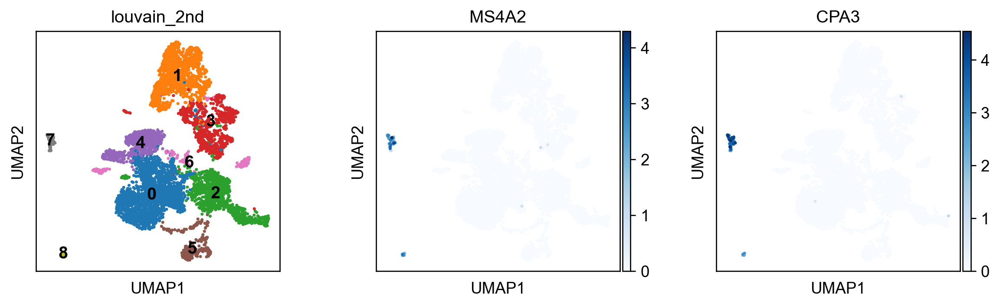

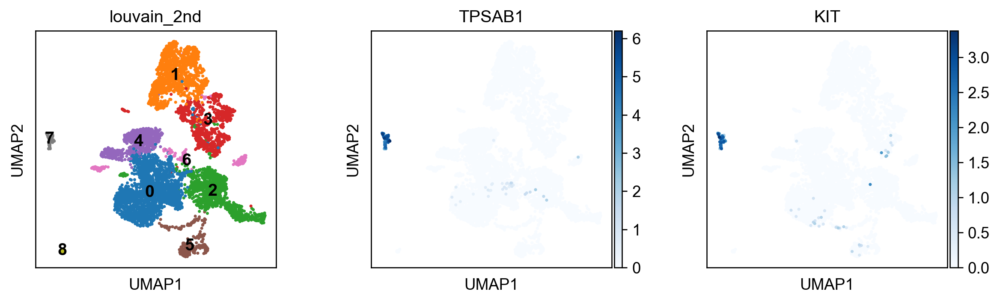

In [104]:
sc.pl.umap(adata, color=['louvain_2nd', 'MS4A2', 'CPA3'], cmap='Blues', legend_loc='on data', show=True)
sc.pl.umap(adata, color=['louvain_2nd', 'TPSAB1', 'KIT'], cmap='Blues', legend_loc='on data', show=True)

## Marker genes

### Mast cells [pro-metastasis]

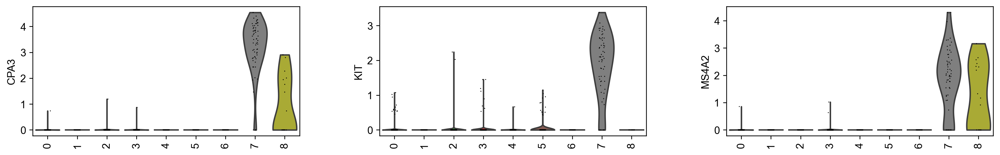

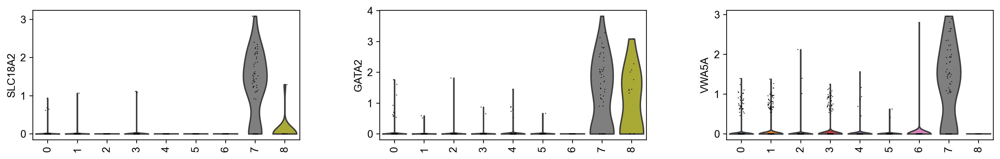

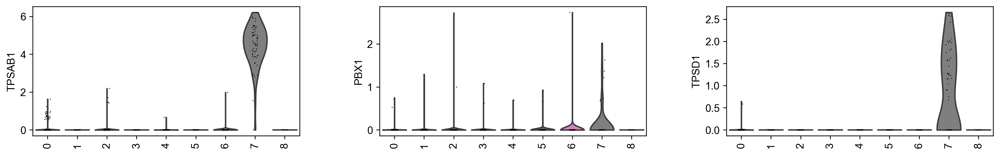

In [106]:
with rc_context({'figure.figsize': (5, 2.5), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.violin(adata, ['CPA3', 'KIT', 'MS4A2'], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)
    sc.pl.violin(adata, ['SLC18A2', 'GATA2', 'VWA5A'], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)
    sc.pl.violin(adata, ['TPSAB1', 'PBX1', 'TPSD1'], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)

### Macrophage

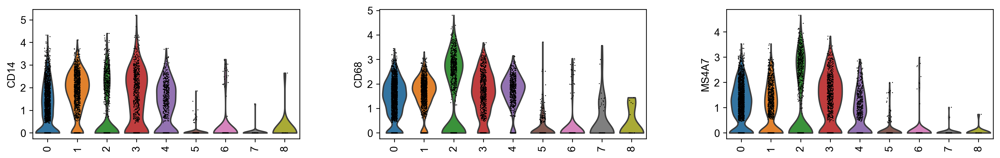

In [107]:
with rc_context({'figure.figsize': (5, 2.5), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.violin(adata, ['CD14', 'CD68', 'MS4A7'], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)

### Dendritic cells

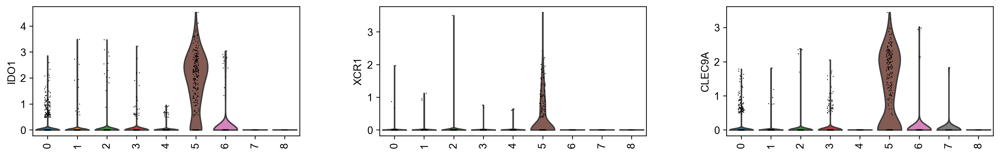

In [122]:
with rc_context({'figure.figsize': (5, 2.5), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
# cDC1
    sc.pl.violin(adata, ['IDO1', 'XCR1', 'CLEC9A'], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)

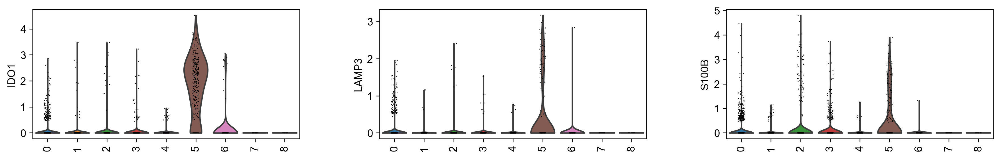

In [108]:
with rc_context({'figure.figsize': (5, 2.5), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
# cDC1
    sc.pl.violin(adata, ['IDO1', 'LAMP3', 'S100B'], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)

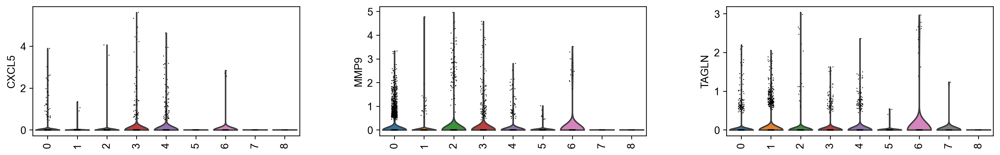

In [109]:
with rc_context({'figure.figsize': (5, 2.5), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
# cDC2
    sc.pl.violin(adata, ['CXCL5', 'MMP9', 'TAGLN'], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)
    # sc.pl.violin(adata, ['APOE', 'C1QA', 'C1QB',], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)
    # sc.pl.violin(adata, ['FCGR3A', 'CLEC10A', 'APOC1'], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)

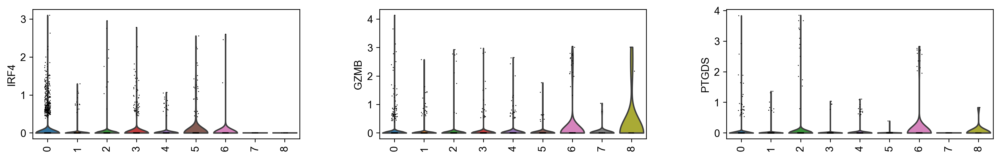

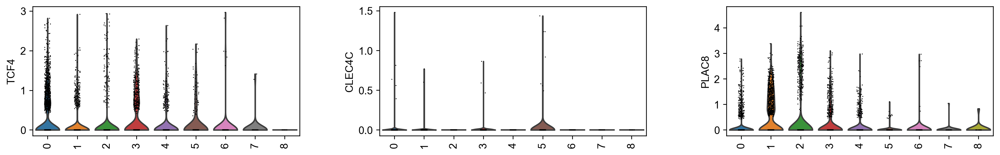

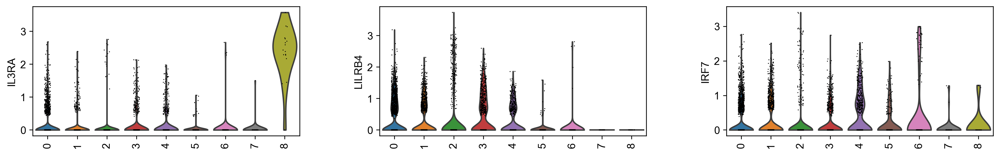

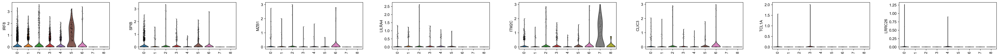

In [110]:
with rc_context({'figure.figsize': (5, 2.5), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
# pDC
    sc.pl.violin(adata, ['IRF4', 'GZMB', 'PTGDS'], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)
    sc.pl.violin(adata, ['TCF4', 'CLEC4C', 'PLAC8'], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)
    sc.pl.violin(adata, ['IL3RA', 'LILRB4', 'IRF7'], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)
    sc.pl.violin(adata, ['IRF8', 'SPIB', 'MZB1', 'LILRA4'], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)
    sc.pl.violin(adata, ['ITM2C', 'CLIC3', 'TCL1A', 'LRRC26'], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)

### MDSC, [Myeloid-Derived Suppressor Cell, anti-metastasis]

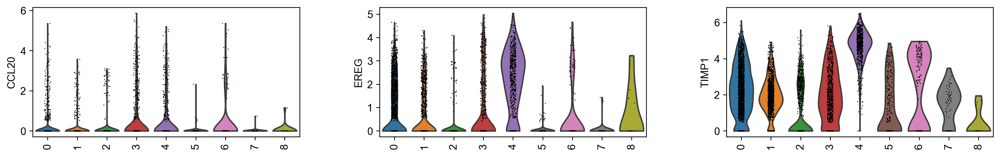

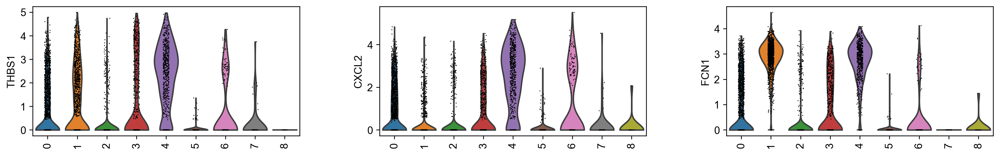

In [111]:
with rc_context({'figure.figsize': (5, 2.5), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
# MDSC
    sc.pl.violin(adata, ['CCL20', 'EREG', 'TIMP1'], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)
    sc.pl.violin(adata, ['THBS1', 'CXCL2', 'FCN1'], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)

### Neutrophils

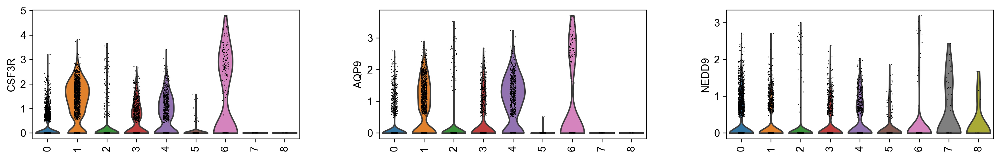

In [112]:
with rc_context({'figure.figsize': (5, 2.5), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.violin(adata, ['CSF3R', 'AQP9', 'NEDD9'], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)

### Monocytes

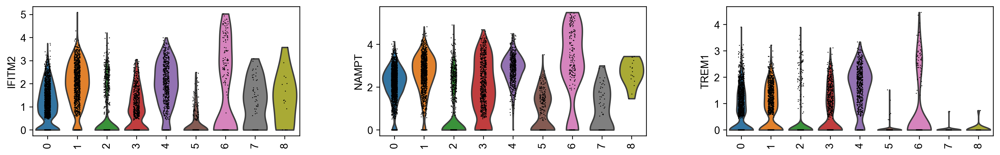

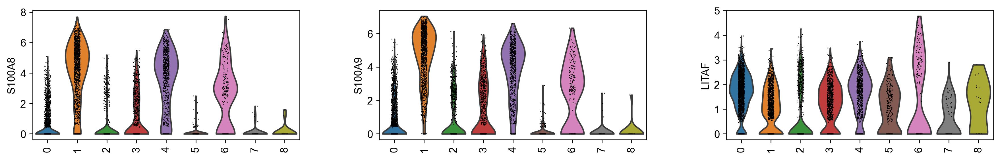

In [113]:
with rc_context({'figure.figsize': (5, 2.5), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.violin(adata, ['IFITM2', 'FCN1', 'TREM1'], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)    
    sc.pl.violin(adata, ['S100A8', 'S100A9', 'LITAF'], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)
    # sc.pl.violin(adata, ['VCAN', 'FGL2', 'SAMHD1'], groupby='louvain_2nd', rotation=90, swap_axes=True, show=True)

In [114]:
adata.obs

,batch,n_genes_by_counts,total_counts,n_genes,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,n_counts_all,umap_density_batch,louvain,sample,louvain_anno,louvain_2nd,predicted_labels,over_clustering,majority_voting,conf_score
ATCGTAGTCCGTGACG-1,Col_N_1,442,916.0,442,6.093570,6.821107,40.393013,89.0,4.499810,9.716157,13.0,2.639057,1.419214,0.0,0.000000,0.000000,927.649597,0.110158,3,Col_N,Myeloid cells,6,Monocytes,78,Monocytes,0.929089
CAAGGGACAGAGGCTA-1,Col_N_1,326,712.0,326,5.789960,6.569481,45.786517,61.0,4.127134,8.567416,11.0,2.484907,1.544944,0.0,0.000000,0.000000,731.465454,0.113902,3,Col_N,Myeloid cells,6,Monocytes,78,Monocytes,0.992200
CAGCAATAGGACAGCT-1,Col_N_1,782,1448.0,782,6.663133,7.278629,20.165746,133.0,4.897840,9.185083,226.0,5.424950,15.607736,0.0,0.000000,0.000000,1339.269043,0.065946,3,Col_N,Myeloid cells,2,Macrophages,96,Macrophages,0.363076
CAGGGCTCATGTACGT-1,Col_N_1,2466,9730.0,2466,7.810758,9.183072,20.400822,845.0,6.740520,8.684481,1943.0,7.572503,19.969168,7.0,2.079442,0.071942,2090.915039,0.046685,8,Col_N,Myeloid cells,1,Monocytes,62,Monocytes,0.994861
CATTGAGCAAAGGGCT-1,Col_N_1,2708,11213.0,2708,7.904335,9.324919,21.840721,1009.0,6.917706,8.998485,1874.0,7.536364,16.712744,0.0,0.000000,0.000000,2167.414307,0.073181,8,Col_N,Myeloid cells,3,Macrophages,96,Macrophages,0.114627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTACGTTAGGCTCACC-1,Liv_T_12,2836,14258.0,2836,7.950502,9.565144,20.823397,404.0,6.003887,2.833497,2651.0,7.883070,18.593069,1.0,0.693147,0.007014,2133.536133,0.020422,3,Liv_T,Myeloid cells,0,DC,27,DC,0.187687
TTCTTCCCACCTCTGT-1,Liv_T_12,2262,11611.0,2262,7.724447,9.359795,30.695031,779.0,6.659294,6.709156,1691.0,7.433667,14.563775,0.0,0.000000,0.000000,1868.611816,0.019112,3,Liv_T,Myeloid cells,5,DC,9,DC,0.993027
TTGAACGGTACTTCCC-1,Liv_T_12,911,2450.0,911,6.815640,7.804251,26.040816,224.0,5.416101,9.142857,385.0,5.955837,15.714286,1.0,0.693147,0.040816,1294.677856,0.019674,3,Liv_T,Myeloid cells,2,Macrophages,5,Macrophages,0.999743
TTGTTCATCCGCGGAT-1,Liv_T_12,337,1121.0,337,5.823046,7.022868,50.401427,108.0,4.691348,9.634254,142.0,4.962845,12.667261,0.0,0.000000,0.000000,556.812134,0.025232,3,Liv_T,Myeloid cells,2,Macrophages,5,Macrophages,0.997746


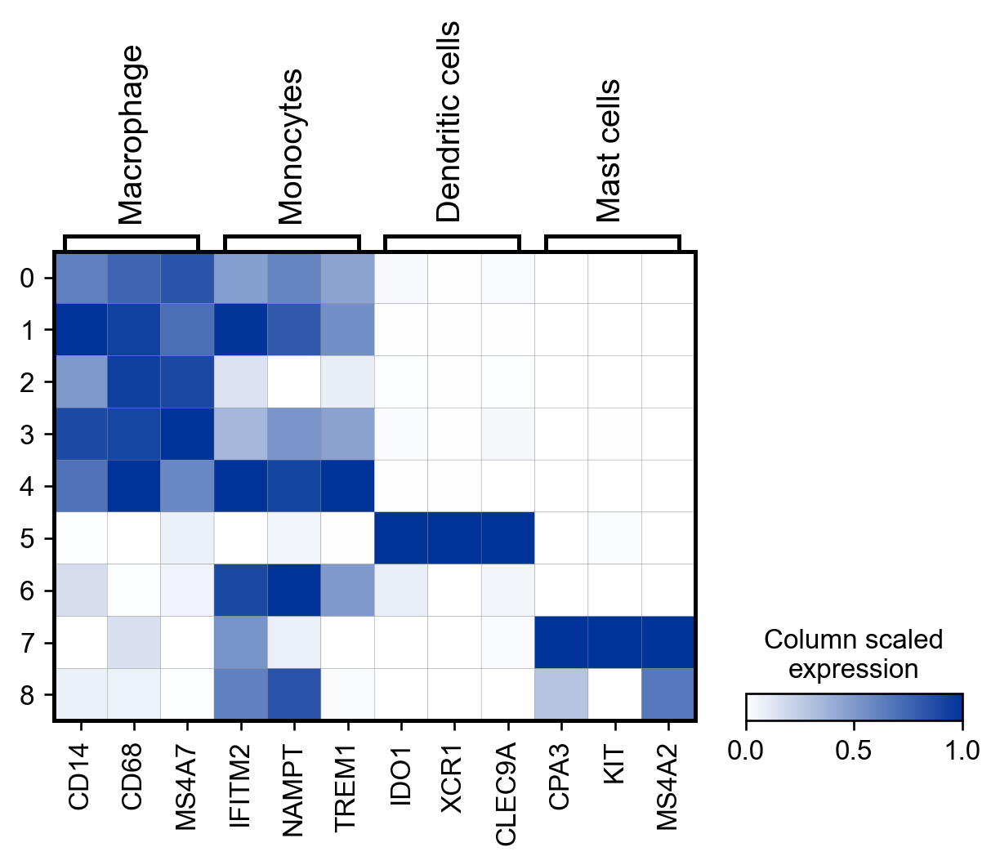

In [123]:
marker_genes_Myeloid = {
    'Macrophage': ['CD14', 'CD68', 'MS4A7'],    
    'Monocytes': ['IFITM2', 'FCN1', 'TREM1'],
    'Dendritic cells': ['IDO1', 'XCR1', 'CLEC9A'],
    'Mast cells': ['CPA3', 'KIT', 'MS4A2'],
    # 'cDC1': ['IDO1', 'LAMP3', 'S100B'],
    # 'cDC2': ['CXCL5', 'MMP9', 'TAGLN'],
    # 'pDC': ['IRF4', 'GZMB', 'PTGDS'],
    # 'Neutrophils': ['CSF3R', 'AQP9', 'NEDD9'],
    # 'Monocytes': ['VCAN', 'FGL2', 'SAMHD1'],
    # 'MDSC': ['CCL20', 'EREG', 'TIMP1'], 
    # 'M1': ['APOE', 'APOC1', 'IFI27'], 
    # 'M2': ['MRC1', 'SELENOP', 'CD163'], 
    # 'M2-like': ['FCGR3A', 'PLXDC2', 'LRP1'],
    # 'cDC1': ['XCR1', 'LAMP3', 'RUNX3'],
    # 'cDC2': ['IL32', 'TAGLN', 'ACTA2'],
    # 'pDC': ['TCF4', 'GZMB', 'LILRA4'], 
    }
color_matrixplot_1 = mpl.colors.LinearSegmentedColormap.from_list('blue', [(0, '#FFFFFF'), (1, '#003399')], N=256)
sc.pl.matrixplot(adata, marker_genes_Myeloid, groupby='louvain_2nd', use_raw=True,
    dendrogram=False, cmap=color_matrixplot_1, standard_scale='var', colorbar_title='Column scaled\nexpression', show=True, save="cluster.pdf")

## Myeloid cell clusters

In [128]:
adata.obs['Myeloid_cluster'] = adata.obs['louvain_2nd'].replace(
    ['0', '1', '2', '3', '4',
    '5', '6', '7', '8'
    ],
    ['Macrophage', 'Monocytes', 'Macrophage', 'Macrophage', 'Monocytes',
    'Dendritic cells', 'Macrophage', 'Mast cells', 'Mast cells'
    ])

In [129]:
adata.obs['Myeloid_cluster'].cat.categories

Index(['Macrophage', 'Monocytes', 'Dendritic cells', 'Mast cells'], dtype='object')

In [ ]:
# adata.obs['Myeloid_cluster'].cat.reorder_categories(
#     ['Macrophage', 'Monocytes', 'Dendritic cells', 'Mast cells'], inplace=True, ordered=True)
# adata.obs['Myeloid_cluster'].cat.categories

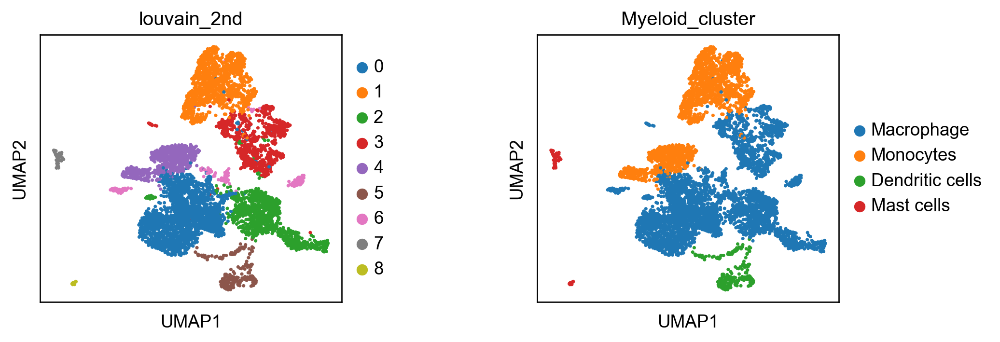

In [130]:
with rc_context({'figure.figsize': (3, 3), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    ax = sc.pl.umap(adata, color=['louvain_2nd', 'Myeloid_cluster'], ncols=2, wspace=0.5, legend_loc='right margin', show=True, save="_03_Myeloid_v1.pdf")

In [131]:
adata.obs['Myeloid_cluster'].value_counts()

Macrophage         4319
Monocytes          1970
Dendritic cells     260
Mast cells           78
Name: Myeloid_cluster, dtype: int64

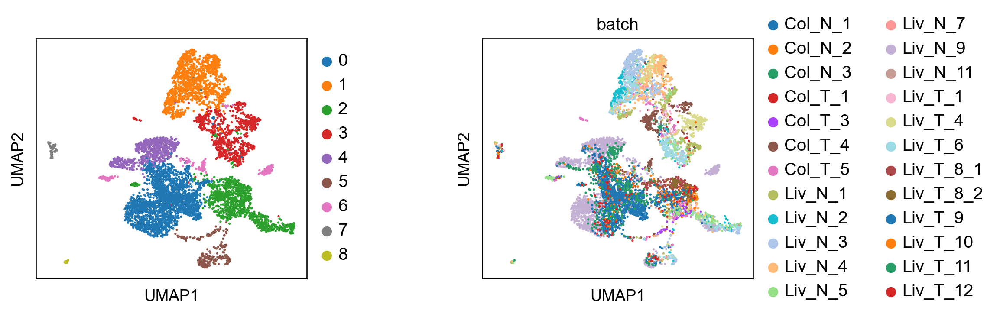

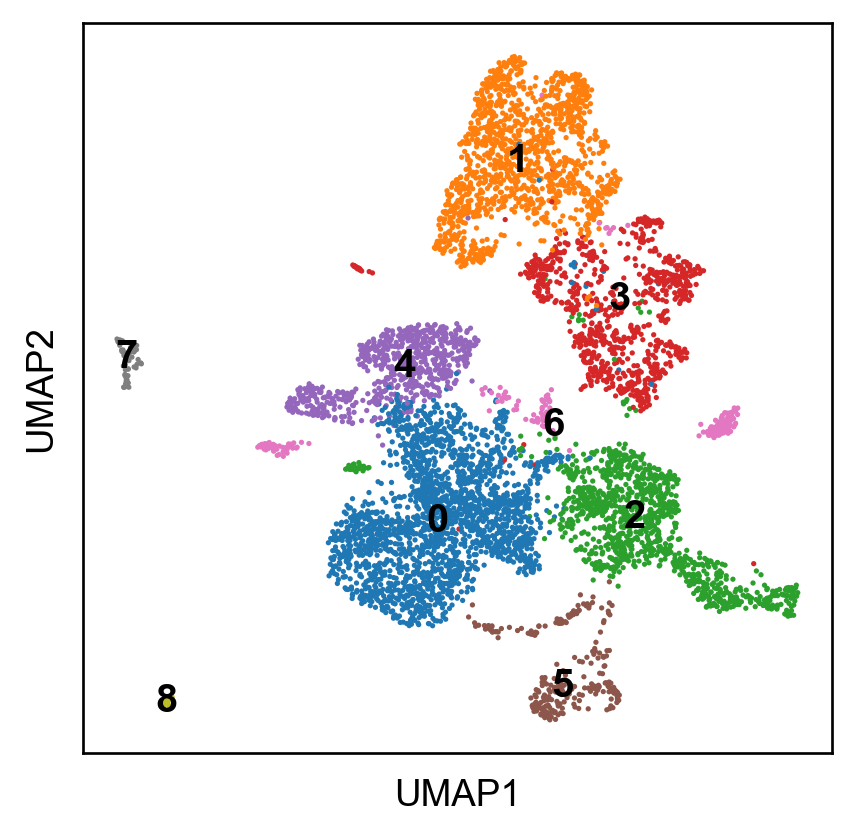

In [132]:
with rc_context({'figure.figsize': (3, 3), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.umap(adata, color=['louvain_2nd', 'batch'], title='', size=10, wspace=0.5, legend_fontsize=12, frameon=True, legend_loc='right margin', show=True)

with rc_context({'figure.figsize': (4, 4), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.umap(adata, color = ['louvain_2nd'], title='', size=10, legend_loc='on data', legend_fontsize=12, frameon=True, wspace=0.5, show=True)

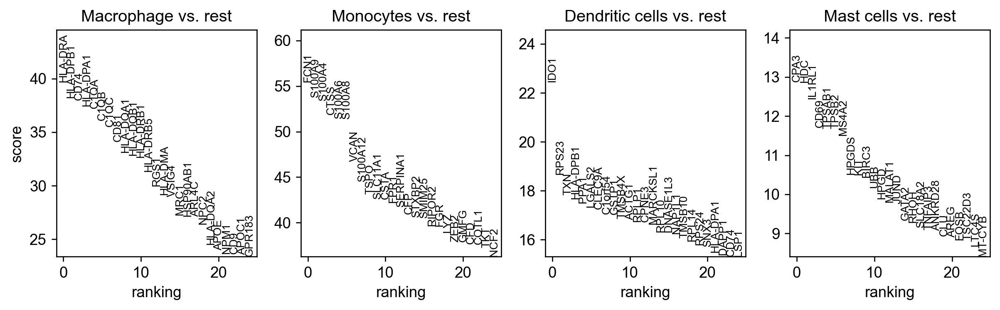

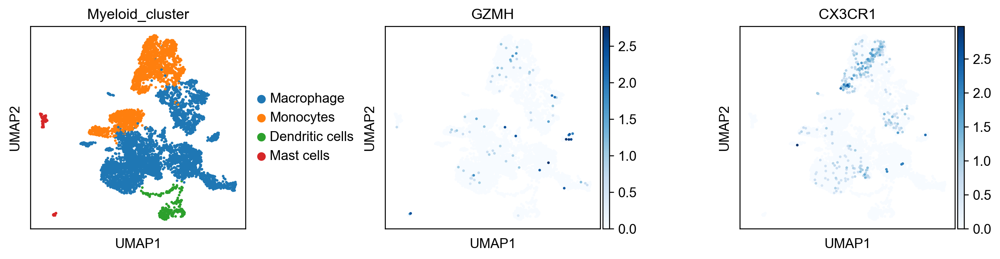

In [133]:
sc.pp.log1p(adata)

sc.tl.rank_genes_groups(adata, 'Myeloid_cluster', method='wilcoxon', pts=True)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, show=True)

res = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(500)
res.to_csv("/Users/xuewei/ZxProjects/CRC/2023_GSE231559/01_preprocessing/30_Myeloid_clustering/30_Myeloid_diff_top500_v2.csv")

sc.pl.umap(adata, color=['Myeloid_cluster', 'GZMH', 'CX3CR1'], cmap='Blues', legend_loc='right margin', wspace=0.5, show=True)
# sc.pl.umap(adata, color=['majority_voting', 'TPSAB1', 'KIT'], cmap='Blues', legend_loc='right margin', wspace=0.8, show=True)

In [140]:
marker_genes_Myeloid = {
    'Macrophage': ['APOE', 'C1QA', 'C1QB'],
    'Monocytes': ['S100A9', 'FCN1', 'S100A8'],
    'Dendritic cells': ['IDO1', 'XCR1', 'CLEC9A'],
    'Mast cells': ['CPA3', 'KIT', 'MS4A2'],
    # 'cDC2': ['CXCL5', 'MMP9', 'TAGLN'],
    # 'pDC': ['IRF4', 'GZMB', 'PTGDS'],
    # 'Neutrophils': ['CSF3R', 'AQP9', 'NEDD9'],
    # 'Monocytes': ['VCAN', 'FGL2', 'SAMHD1'],
    # 'MDSC': ['CCL20', 'EREG', 'TIMP1'], 
    # 'M1': ['APOE', 'APOC1', 'IFI27'], 
    # 'M2': ['MRC1', 'SELENOP', 'CD163'], 
    # 'M2-like': ['FCGR3A', 'PLXDC2', 'LRP1'],
    # 'cDC1': ['XCR1', 'LAMP3', 'RUNX3'],
    # 'cDC2': ['IL32', 'TAGLN', 'ACTA2'],
    # 'pDC': ['TCF4', 'GZMB', 'LILRA4'], 
    }

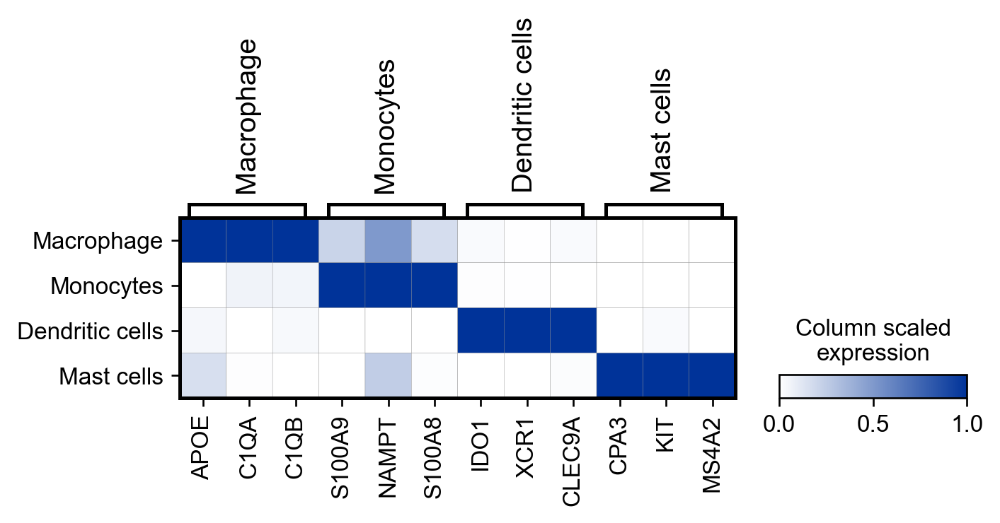

In [141]:
color_matrixplot_1 = mpl.colors.LinearSegmentedColormap.from_list('blue', [(0, '#FFFFFF'), (1, '#003399')], N=256)
with rc_context({'figure.figsize': (6, 4), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.matrixplot(adata, marker_genes_Myeloid, groupby='Myeloid_cluster', dendrogram=False, 
                     cmap=color_matrixplot_1, standard_scale='var', colorbar_title='Column scaled\nexpression', show=True, save="01_cluster.pdf")

In [142]:
adata.uns['Myeloid_cluster_colors']

['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

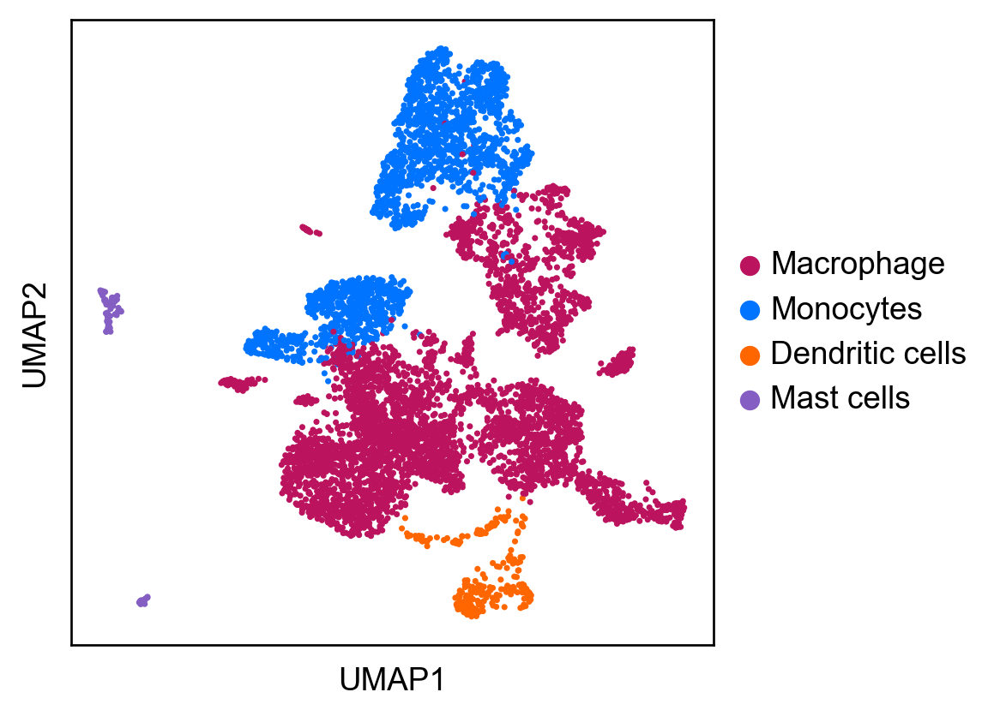

['#bb135d', '#0073ff', '#ff6600', '#845ec2']

In [150]:
with rc_context({'figure.figsize': (4, 4), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.umap(adata, color=['Myeloid_cluster'], legend_loc='right margin', title='', palette=['#BB135D', '#0073FF', '#FF6600', '#845EC2'], show=True, save='_02_cluster_v1.pdf')

adata.uns['Myeloid_cluster_colors']

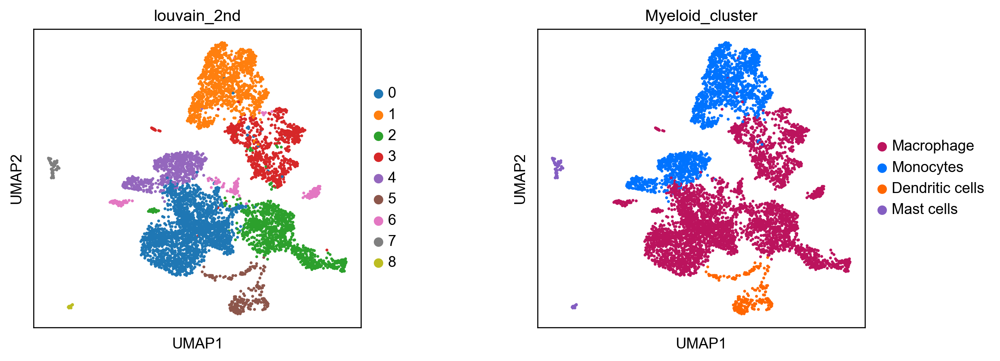

In [151]:
with rc_context({'figure.figsize': (4, 4), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    ax = sc.pl.umap(adata, color=['louvain_2nd', 'Myeloid_cluster'], ncols=2, wspace=0.4, legend_loc='right margin', show=True, save="_03_Myeloid_v1.pdf")

In [152]:
adata.obs['Myeloid_cluster'].value_counts()

Macrophage         4319
Monocytes          1970
Dendritic cells     260
Mast cells           78
Name: Myeloid_cluster, dtype: int64